# Computer Vision Project
#### Introduction to Machine learning course | Instructor: Dr. Fatemeh Mirsalehi

<font color='cyan'> Responsible TA: Amirhossein Razlighi </font>

In [1]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm

## Section 1: Implementing a CNN from scratch! (30 points)

### 1.1 - Forward and Backward (20/30 pts)

__CNN__ s are powerfull tools to work with in the scope of _Computer Vision_. You have seen MLPs before and know how to do forward and backward pass on them. In this part, we want to create a convolutional layer (a simple one, of course!) just to understand well that how a Convolutional Layer works, behind the scenes. Then, we can simply use PyTorch's `Conv2D` layer for the rest of this project, because we understood that how Convolutions work, behind the scene!

__FORWARD PASS__:

In forward pass, you should apply the convolution operation on the input image. The convolution operation is as follows:

$$
\text{output}[i, j] = \sum_{k=0}^{K-1} \sum_{l=0}^{L-1} \text{input}[i+k, j+l] \times \text{kernel}[k, l]
$$

You can see a sample convolution operation (with a $3 \times 3$ kernel) in the following image:
<div style="text-align:center;">
  <img src="./images/Conv.gif" /> 
</div>

Please note that, these are samples for you to understand the operation better. For _forward pass_ that you should implement, please notice that you should convolve the kernel along all $C$ channels of the input image. So, the output shape should be $(N, H_{out}, W_{out})$. These values are calculated as follows:

$$
H_{out} = \frac{H_{in} + 2 \times \text{padding}}{\text{stride} - HH} + 1
$$
$$
W_{out} = \frac{W_{in} + 2 \times \text{padding}}{\text{stride} - WW} + 1
$$


where $HH$ and $WW$ are the height and width of the kernel, respectively. __stride__ is the step size of the kernel, and __padding__ is the number of zeros that should be padded to the input image. Please also note that $b$ stands for bias, which is a scalar value that should be added to the output of the convolution operation. (for each kernel)

You can see a more detailed example, below:

<div style="text-align:center;">
  <img src="./images/conv3.gif" /> 
</div>

__Backward Pass__:

In backward pass, you should calculate gradient of output with respect to the input image and the kernel. These gradients will be used in _optimization_ to update kernel weights. (You saw something similar, in using MLPs with gradient descent algorithm!). So, we need $d_x$, $d_w$ and $d_b$ in the backward pass. These are calculated as follows:

$$
dx_{padded} [n, :, i * stride: i * stride + HH, j * stride: j * stride + WW] += w[f] \times dout[n, f, i, j]
$$

$$
dw_{f} = \sum_{n=0}^{N - 1} \sum_{i=0}^{H_{out} - 1} \sum_{j=0}^{W_{out} - 1} x_{padded}[n, :, i * stride: i * stride + HH, j * stride: j * stride + WW] \times dout[n, f, i, j]  
$$

$$
db_{f} = \sum_{n=0}^{N - 1} \sum_{i=0}^{H_{out} - 1} \sum_{j=0}^{W_{out} - 1} dout[n, f, i, j]
$$

For better understanding of the backward pass, you can see the following image:

<div style="text-align:center;">
  <img src="./images/backprop_cs231n.png" />
</div>


In [2]:
import numpy as np


class MyConv:
    def __init__(self, stride, padding):
        self.stride = stride
        self.padding = padding

    def forward(self, x, w, b):
        N, _, H, W = x.shape
        F, _, HH, WW = w.shape
        pad = self.padding
        stride = self.stride
        H_out = 1 + (H + 2 * pad - HH) // stride
        W_out = 1 + (W + 2 * pad - WW) // stride

        x_pad = np.pad(x, ((0, 0), (0, 0), (pad, pad), (pad, pad)), mode="constant")
        out = np.zeros((N, F, H_out, W_out))

        for n in range(N):
            for f in range(F):
                for k in range(H_out):
                    for l in range(W_out):
                        out[n, f, k, l] = np.sum(x_pad[n, :, k * stride : k * stride + HH, l * stride : l * stride + WW] * w[f]) + b[f]

        cache = (x, w, b, x_pad)
        self.cache = cache
        return out

    def backward(self, dout):
        x, w, b, x_padded = self.cache

        N, _, _, _ = x.shape
        F, _, HH, WW = w.shape
        N, F, H_OUT, W_OUT = dout.shape

        dw = np.zeros_like(w)
        db = np.zeros_like(b)
        dx_padded = np.zeros_like(x_padded)

        for n in range(N):
            for f in range(F):
                for i in range(H_OUT):
                    for j in range(W_OUT):
                        dw[f] += x_padded[n, :, i * self.stride : i * self.stride + HH, j * self.stride : j * self.stride + WW] * dout[n, f, i, j]
                        dx_padded[
                            n,
                            :,
                            i * self.stride : i * self.stride + HH,
                            j * self.stride : j * self.stride + WW,
                        ] += w[f] * dout[n, f, i, j]
                        db[f] = np.sum(dout[:, f, :, :])

        dx = dx_padded[:, :, self.padding:-self.padding, self.padding:-self.padding]

        self.dx = dx
        self.dw = dw
        self.db = db
        
        return dx, dw, db

In [3]:
def rel_error(x, y):
  return np.max(np.abs(x - y) / (np.maximum(1e-8, np.abs(x) + np.abs(y))))

In [4]:
# A simple test for forward pass (DO NOT CHANGE)

x_shape = (2, 3, 4, 4)
w_shape = (3, 3, 4, 4)
x = np.linspace(-0.1, 0.5, num=np.prod(x_shape)).reshape(x_shape)
w = np.linspace(-0.2, 0.3, num=np.prod(w_shape)).reshape(w_shape)
b = np.linspace(-0.1, 0.2, num=3)

out = MyConv(stride=2, padding=1).forward(x, w, b)
correct_out = np.array([[[[[-0.08759809, -0.10987781],
                           [-0.18387192, -0.2109216 ]],
                          [[ 0.21027089,  0.21661097],
                           [ 0.22847626,  0.23004637]],
                          [[ 0.50813986,  0.54309974],
                           [ 0.64082444,  0.67101435]]],
                         [[[-0.98053589, -1.03143541],
                           [-1.19128892, -1.24695841]],
                          [[ 0.69108355,  0.66880383],
                           [ 0.59480972,  0.56776003]],
                          [[ 2.36270298,  2.36904306],
                           [ 2.38090835,  2.38247847]]]]])

# The outputted difference which is printed, should be around 1e-8
print ('Testing conv_forward_naive')
print ('difference: ', rel_error(out, correct_out))

Testing conv_forward_naive
difference:  2.2121476417505994e-08


In [5]:
def eval_numerical_gradient_array(f, x, df, h=1e-5):
  grad = np.zeros_like(x)
  it = np.nditer(x, flags=['multi_index'], op_flags=['readwrite'])
  while not it.finished:
    ix = it.multi_index
    
    oldval = x[ix]
    x[ix] = oldval + h
    pos = f(x).copy()
    x[ix] = oldval - h
    neg = f(x).copy()
    x[ix] = oldval
    
    grad[ix] = np.sum((pos - neg) * df) / (2 * h)
    it.iternext()
  return grad

In [6]:
# A simple test for backward pass (DO NOT CHANGE)

x = np.random.randn(4, 3, 5, 5)
w = np.random.randn(2, 3, 3, 3)
b = np.random.randn(
    2,
)
dout = np.random.randn(4, 2, 5, 5)
conv = MyConv(stride=1, padding=1)

dx_num = eval_numerical_gradient_array(
    lambda x: conv.forward(x, w, b), x, dout
)
dw_num = eval_numerical_gradient_array(
    lambda w: conv.forward(x, w, b), w, dout
)
db_num = eval_numerical_gradient_array(
    lambda b: conv.forward(x, w, b), b, dout
)

out = conv.forward(x, w, b)
dx, dw, db = conv.backward(dout)

# Your printed errors should be around 1e-9
print("Testing conv_backward_naive function")
print("dx error: ", rel_error(dx, dx_num))
print("dw error: ", rel_error(dw, dw_num))
print("db error: ", rel_error(db, db_num))

Testing conv_backward_naive function
dx error:  2.977242728369983e-09
dw error:  1.84788925042108e-10
db error:  5.986198045998808e-12


### 1.2 - Visualizing Convolution results (10/30 pts)

In this part, we try to visualize the results of the convolution operation. We will 2 sample photos (in `Images/Sample`) and then we will use our `MyConv` class to apply some cool convolutions (and see their result on an image).

In [8]:
from PIL import Image

first_img, second_img = Image.open("./images/Sample/Sharif_1.JPG"), Image.open(
    "./images/Sample/Sharif_2.jpg"
)
first_img = first_img.resize((256, 256))
second_img = second_img.resize((256, 256))

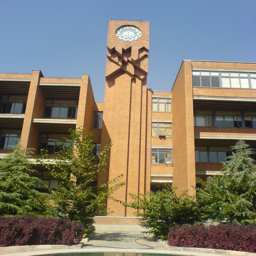

In [9]:
first_img

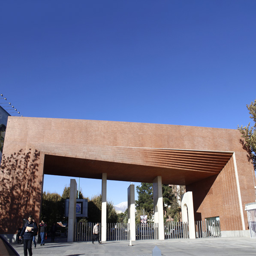

In [10]:
second_img

Convolutions have some interesting usages in image processing. For example, you can extract edges from an image by applying a convolution with a kernel that detects edges. Or you can convolve a specific kernel with your image to make it grayscale or blurred! Look at the definitions below:

__Edge Detection Kernel__:

_Sobel_ is one of the most famous edge detection kernels. It has two kernels, one for detecting vertical edges and the other for horizontal edges. You can see the kernels below:
$$
\text{Sobel}_x = \begin{bmatrix}
-1 & 0 & 1 \\
-2 & 0 & 2 \\
-1 & 0 & 1
\end{bmatrix}
$$

$$
\text{Sobel}_y = \begin{bmatrix}
-1 & -2 & -1 \\
0 & 0 & 0 \\
1 & 2 & 1
\end{bmatrix}
$$


__Grayscale Kernel__:

You can simply convolve the image with the following kernel to make it grayscale:

$$
\text{Grayscale\_across\_R} = \begin{bmatrix}
0 & 0 & 0 \\
0 & 0.3 & 0 \\
0 & 0 & 0
\end{bmatrix}
$$

$$
\text{Grayscale\_across\_G} = \begin{bmatrix}
0 & 0 & 0 \\
0 & 0.6 & 0 \\
0 & 0 & 0
\end{bmatrix}
$$

$$
\text{Grayscale\_across\_B} = \begin{bmatrix}
0 & 0 & 0 \\
0 & 0.1 & 0 \\
0 & 0 & 0
\end{bmatrix}
$$

(Convolve each kernel with its corresponding channel)

__Blurring Kernel__:

One of the famous kernels to blur an image is _Gaussian Blur_. You can see the kernel below:

$$
\text{Gaussian\_Blur} = \frac{1}{16} \times \begin{bmatrix}
1 & 2 & 1 \\
2 & 4 & 2 \\
1 & 2 & 1
\end{bmatrix}
$$


In [11]:
img_size = 256

x = np.zeros((2, 3, img_size, img_size))
x[0] = np.array(first_img).transpose(2, 0, 1)
x[1] = np.array(second_img).transpose(2, 0, 1)

grayscale = np.array([[[0, 0, 0], [0, 0.3, 0], [0, 0, 0]],
                      [[0, 0, 0], [0, 0.6, 0], [0, 0, 0]],
                      [[0, 0, 0], [0, 0.1, 0], [0, 0, 0]]])

sobel_x = np.array([[[-1, 0, 1], [-2, 0, 2], [-1, 0, 1]],
                    [[-1, 0, 1], [-2, 0, 2], [-1, 0, 1]],
                    [[-1, 0, 1], [-2, 0, 2], [-1, 0, 1]]])

sobel_y = np.array([[[-1, -2, -1], [0, 0, 0], [1, 2, 1]],
                    [[-1, -2, -1], [0, 0, 0], [1, 2, 1]],
                    [[-1, -2, -1], [0, 0, 0], [1, 2, 1]]])

blur = (1 / 16) * np.array([[[1, 2, 1], [2, 4, 2], [1, 2, 1]],
                            [[1, 2, 1], [2, 4, 2], [1, 2, 1]],
                            [[1, 2, 1], [2, 4, 2], [1, 2, 1]]])

# a convolution weight, holding 4 filters 3x3
w = np.stack([grayscale, sobel_x, sobel_y, blur], axis=0)

b = np.array([0, 128, 128, 0])

conv = MyConv(stride=1, padding=1)
out = conv.forward(x, w, b)

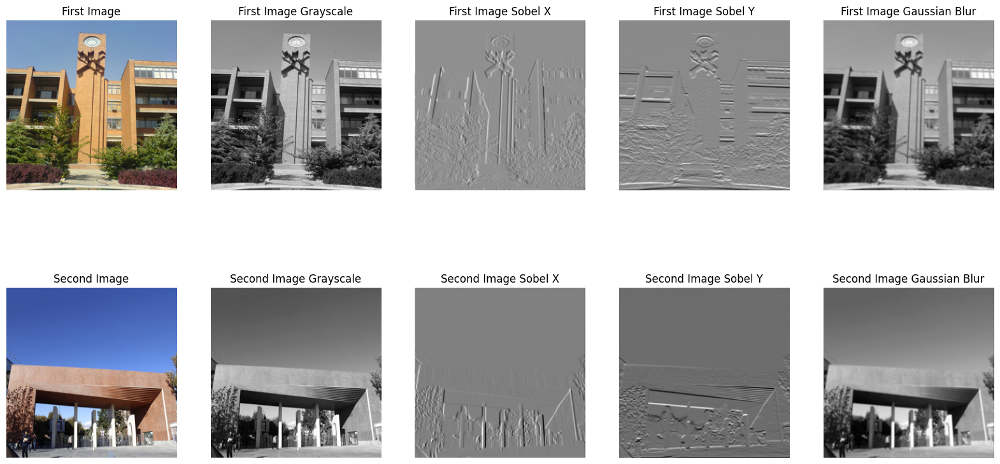

In [12]:
import matplotlib.pyplot as plt

first_titles = ["First Image", "First Image Grayscale", "First Image Sobel X", "First Image Sobel Y", "First Image Gaussian Blur"]
second_titles = ["Second Image", "Second Image Grayscale", "Second Image Sobel X", "Second Image Sobel Y", "Second Image Gaussian Blur"]

plt.figure(figsize=(20, 10))

plt.subplot(2, 5, 1)
plt.title(first_titles[0])
plt.imshow(first_img)
plt.axis("off")

for i in range(out.shape[1]):
    plt.subplot(2, 5, i + 2)
    plt.title(first_titles[i + 1])
    plt.imshow(out[0, i], cmap="gray")
    plt.axis("off")
    
plt.subplot(2, 5, 6)
plt.title(second_titles[0])
plt.imshow(second_img)
plt.axis("off")

for i in range(out.shape[1]):
    plt.subplot(2, 5, out.shape[1] + i + 3)
    plt.title(second_titles[i + 1])
    plt.imshow(out[1, i], cmap="gray")
    plt.axis("off")

plt.show()

Now that we understood how Convolution works, we proceed further to use it in our models to perform a desired and specific task! We can use PyTorch's `Conv2D` layer from now on, because we understood how Convolutions work, behind the scene!

## Section 2: Neural Style Transfer (90 points)

In this part, we are going to implement a famous technique in the field of _Computer Vision_ called __Neural Style Transfer__. This technique is used to apply the style of a specific image to another image. For example, you can apply the style of a famous painting to your photo! Let's get started!

### 2.1 - Importing Libraries

In [13]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim

from PIL import Image
import matplotlib.pyplot as plt

import torchvision.transforms as transforms
from torchvision.models import vgg19, VGG19_Weights

import copy

In [14]:
device = torch.device(
    "cuda"
    if torch.cuda.is_available()
    else "mps" if torch.backends.mps.is_available() else "cpu"
)
torch.set_default_device(device)
device

device(type='mps')

### 2.2 - Loading Images and doing some Preprocessing (5/90 pts)

In this part, you should load the content and style images and preprocess them. Preprocessing includes resizing the images to a specific size, normalizing them, and converting them to PyTorch tensors. You can use `torchvision.transforms` to do these tasks.

In [15]:
img_size = 224 if not device == "cpu" else 128

preprocess = transforms.Compose([
    transforms.Resize((img_size, img_size)),
    transforms.ToTensor()
])

def image_loader(image_name, pp):
    image = Image.open(image_name)
    image = pp(image).unsqueeze(0)
    return image.to(device, torch.float)

In [17]:
style_image = image_loader("./images/Neural_Transfer/Style.jpeg", preprocess)
content_image = image_loader("./images/Neural_Transfer/Content.jpeg", preprocess)

style_image.size(), content_image.size()

(torch.Size([1, 3, 224, 224]), torch.Size([1, 3, 224, 224]))

Here, you should implement a helper function to show you images (which are now in form of pytorch tensors) in the notebook. You can use `torchvision.transforms.ToPILImage` to convert a tensor to a PIL image.

In [18]:
def imshow(tensor, title=None):
    tensor = tensor.squeeze(0)
    image = transforms.ToPILImage()(tensor)
    
    plt.imshow(image)
    if title:
        plt.title(title)
    plt.axis("off")
    plt.pause(0.001)

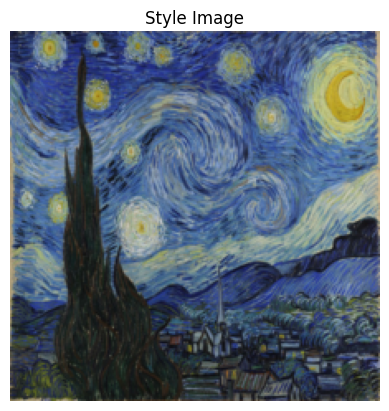

In [19]:
imshow(style_image, "Style Image")

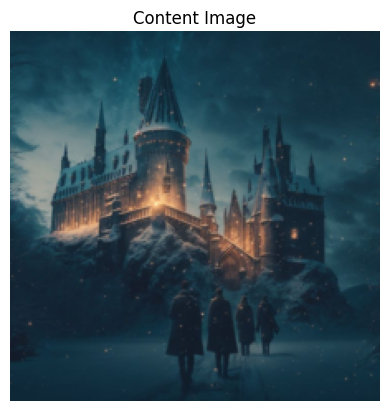

In [20]:
imshow(content_image, "Content Image")

### 2.2 - VGG19 Model (15/90 pts)

One of the important parts of Neural Style Transfer is to use a pre-trained model to extract features from the content and style images. Here, we are going to use a pre-trained VGG19 model to extract features from the images. You can use `torchvision.models.vgg19` to load the model. You should also freeze the weights of the model to prevent them from updating during the optimization process.

<div style="text-align:center;">
  <img src="./Images/VGG-19.png" />
</div>

But what is VGG model? Let's see with a simple experiment:

In [21]:
import certifi
import os

os.environ['SSL_CERT_FILE'] = certifi.where()

Here, please load `VGG19` model from `torchvision.models` and see the architecture of the model. You may need models `features` and `classifier` part stored seperately as we will discuss these both parts.

In [22]:
vgg = vgg19(weights=VGG19_Weights.DEFAULT).to(device)

for param in vgg.parameters():
    param.requires_grad_(False)

vgg_model_features = vgg.features
vgg_model_classifier = vgg.classifier

vgg_model_features, vgg_model_classifier

(Sequential(
   (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
   (1): ReLU(inplace=True)
   (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
   (3): ReLU(inplace=True)
   (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
   (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
   (6): ReLU(inplace=True)
   (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
   (8): ReLU(inplace=True)
   (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
   (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
   (11): ReLU(inplace=True)
   (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
   (13): ReLU(inplace=True)
   (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
   (15): ReLU(inplace=True)
   (16): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
   (17): ReLU(inplace=T

In [23]:
import torchsummary

torchsummary.summary(vgg.to("cpu"), (3, img_size, img_size))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 224, 224]           1,792
              ReLU-2         [-1, 64, 224, 224]               0
            Conv2d-3         [-1, 64, 224, 224]          36,928
              ReLU-4         [-1, 64, 224, 224]               0
         MaxPool2d-5         [-1, 64, 112, 112]               0
            Conv2d-6        [-1, 128, 112, 112]          73,856
              ReLU-7        [-1, 128, 112, 112]               0
            Conv2d-8        [-1, 128, 112, 112]         147,584
              ReLU-9        [-1, 128, 112, 112]               0
        MaxPool2d-10          [-1, 128, 56, 56]               0
           Conv2d-11          [-1, 256, 56, 56]         295,168
             ReLU-12          [-1, 256, 56, 56]               0
           Conv2d-13          [-1, 256, 56, 56]         590,080
             ReLU-14          [-1, 256,

Please briefly explain what is a VGG model used for and what does each `features` and `classifier` part, represent?

**Your Answer:**

<div style="color:skyblue">

VGG is basically a deep CNN model which is both simple and effective in tasks related to image recognition. VGG is mostly used for classifying images into various categories. And how it does that, is that it learns to extract features from different images and then classifies them using fully connected layers. As we said VGG is mostly used for classification tasks related to images, but these are its main uses:

- Image Classification: As we said above, it learns to extract different features from images and then tries to classify them using fully connected layers.

- Feature Extraction: VGG is a __deep__ CNN model so due to its deep and hierarchical nature, it's often used as a feature extractor. Also the pre-trained one (like the one we used above) can be used to extract meaningful and useful features from images and later we can use those features to train our models with.

- Object Detection: Another great feature of it is that it can be fine-tuned to detect a specific object in an image and determine its position.

- Neural Style Transfer: This is the feature of it that we are currently using. It can effectively capture both low-level and high-level features which we can later use to apply a specific style to another image.

Now about the __features__ and __classifier__. <br/> The VGG model is composed of two main parts, features and classifiers.

Features: As it's clear from its name, this part is responsible for extracting features from the images. It consists of multiple layers of convolution and pooling operations which we will discuss later.

- Convolution Layers: These layers apply a series of convolutional filters to the image (like the ones we used earlier) to detect different patterns (like horizontal or vertical edges). Also each of them is followed by a non-linear activation function (mainly ReLU) to introduce non-linearity.

- Pooling Layers: These layers apply downsampling to reduce the huge dimensions of the feature maps. It really helps by reducing the computational complexity and also it can be helpful for capturing the hierarchical nature of the features.

Classifiers: Again it's clear from its name that this part is responsible for classifying the features extracted (by the features part) into different categories. We said earlier that it consists of fully connected layers. Now we discuss about that.

- Fully Connected Layers: These layers take the flattened output of the last pooling layer (related to the features part) and process it through a series of dense layers. Each layer transforms the feature vector to progressively learn the decision boundaries for classification.

Examples:

- Features: 
   - (Convolution Layer): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
   - (Convolution Layer): ReLU(inplace=True)
   - (Convolution Layer): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
   - (Convolution Layer): ReLU(inplace=True)
   - (Pooling Layer): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)

- Classifiers:
   - (FC Layer): Linear(in_features=25088, out_features=4096, bias=True)
   - (FC Layer): ReLU(inplace=True)
   - (FC Layer): Dropout(p=0.5, inplace=False)

</div>

Now, we are going to give a sample image `Images/Neural_Transfer/Car.jpeg` to the model, see the output for classification and also visualize the feature maps (outputs of each convolutional layer) to see what's going on!

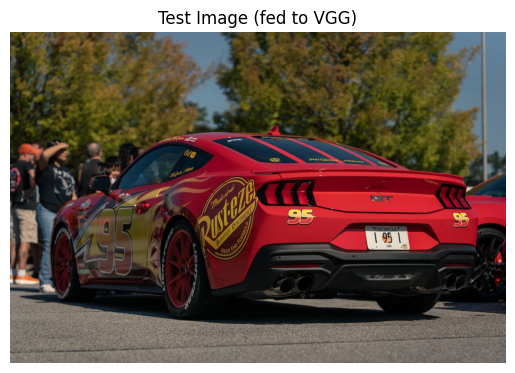

In [24]:
vgg_test_image = Image.open("./images/Neural_Transfer/Car.jpeg")

plt.imshow(vgg_test_image)
plt.title("Test Image (fed to VGG)")
plt.axis("off")

preprocess_vgg = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

input_batch = preprocess_vgg(vgg_test_image).unsqueeze(0).to(device)

vgg = vgg19(weights=VGG19_Weights.DEFAULT).to(device)
vgg.eval()

vgg_features = vgg.features

activation = {}
def get_activation(name):
    def hook(model, input, output):
        activation[name] = output.detach()
    return hook

for name, layer in vgg.features.named_children():
    if isinstance(layer, torch.nn.Conv2d):
        layer.register_forward_hook(get_activation(name))
        
with torch.no_grad():
    output = vgg(input_batch)

probs = torch.nn.functional.softmax(output[0], dim=0)
_, predicted = torch.topk(probs, 1)

As you can see, the output of the classifier is an integer. This integer is actually the **class number** in _Image Net_ dataset. Let's get the name of the class:

In [25]:
import requests

class_idx = requests.get(
    "https://raw.githubusercontent.com/anishathalye/imagenet-simple-labels/master/imagenet-simple-labels.json"
).json()

class_name = class_idx[predicted.item()]

print(f"Predicted class: {class_name}")

Predicted class: sports car


Now that we understood the architecture of VGG, and also the output of its classifier, it's time to extract features from the images! And see what's going on in the feature maps!

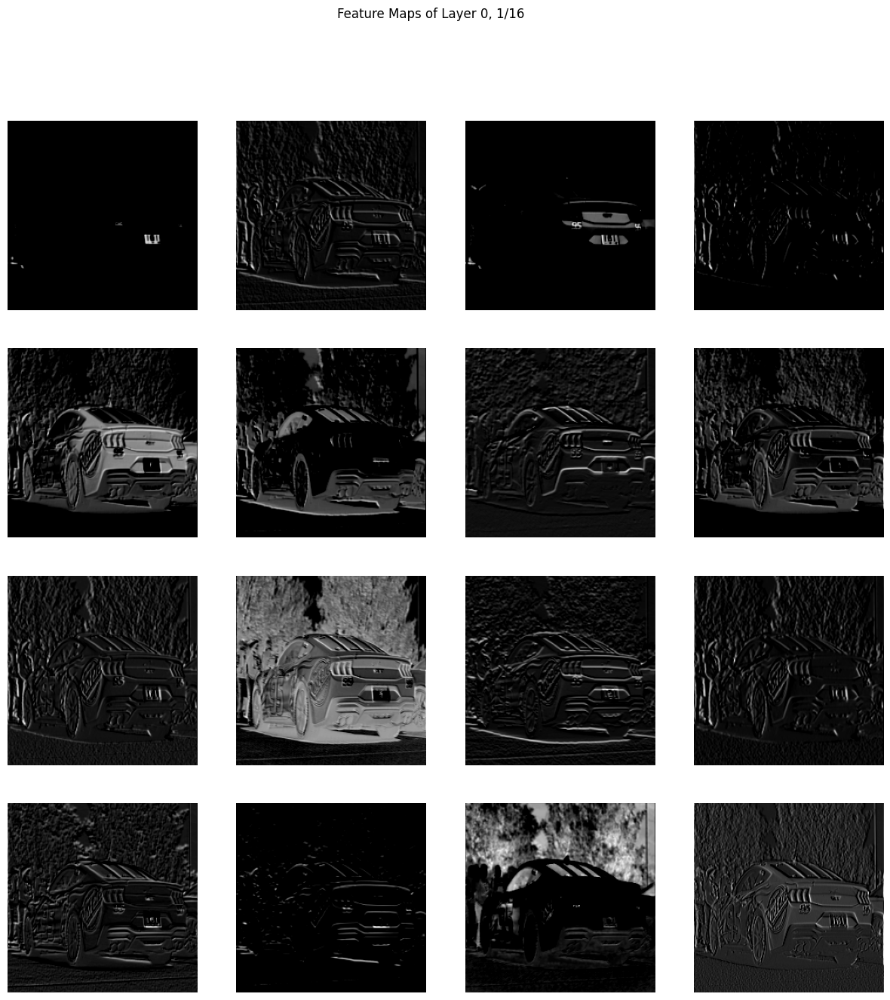

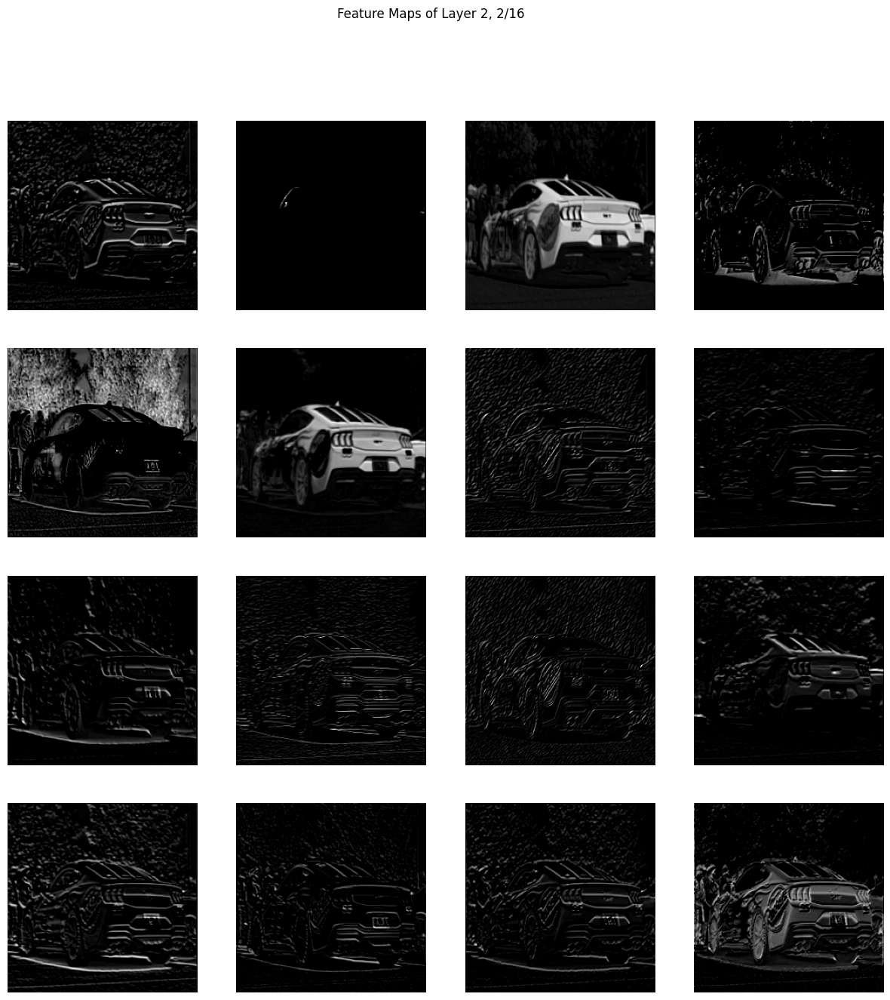

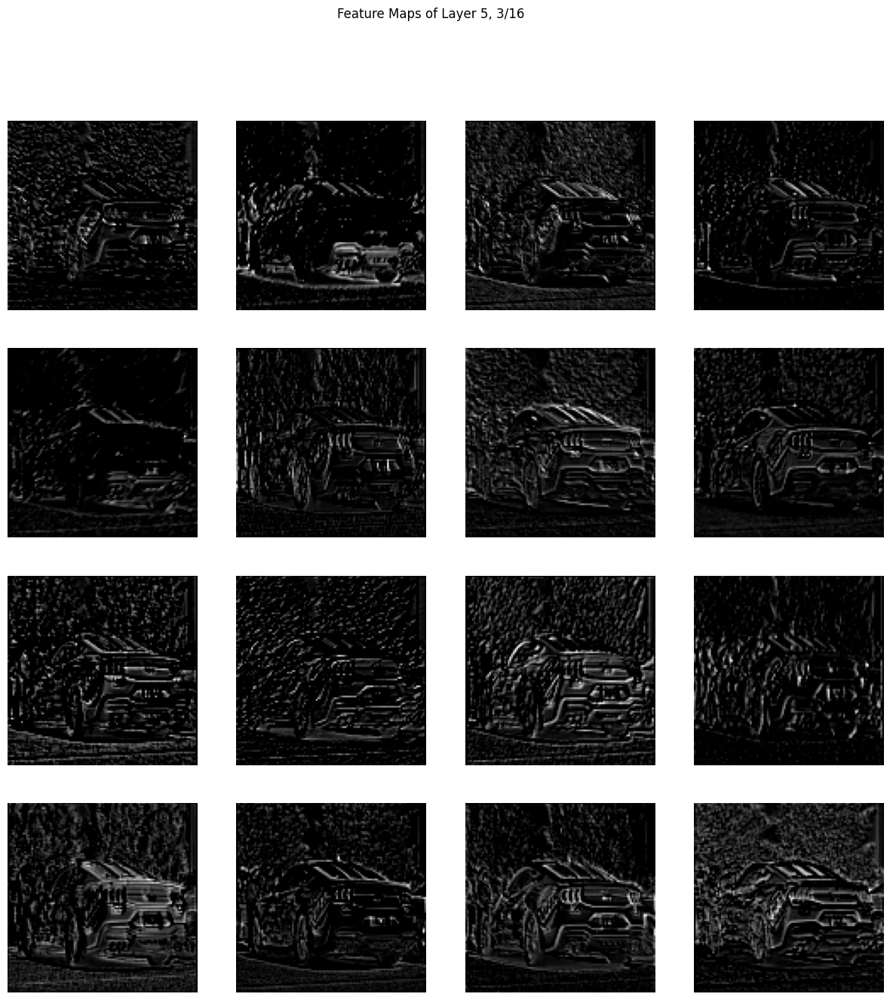

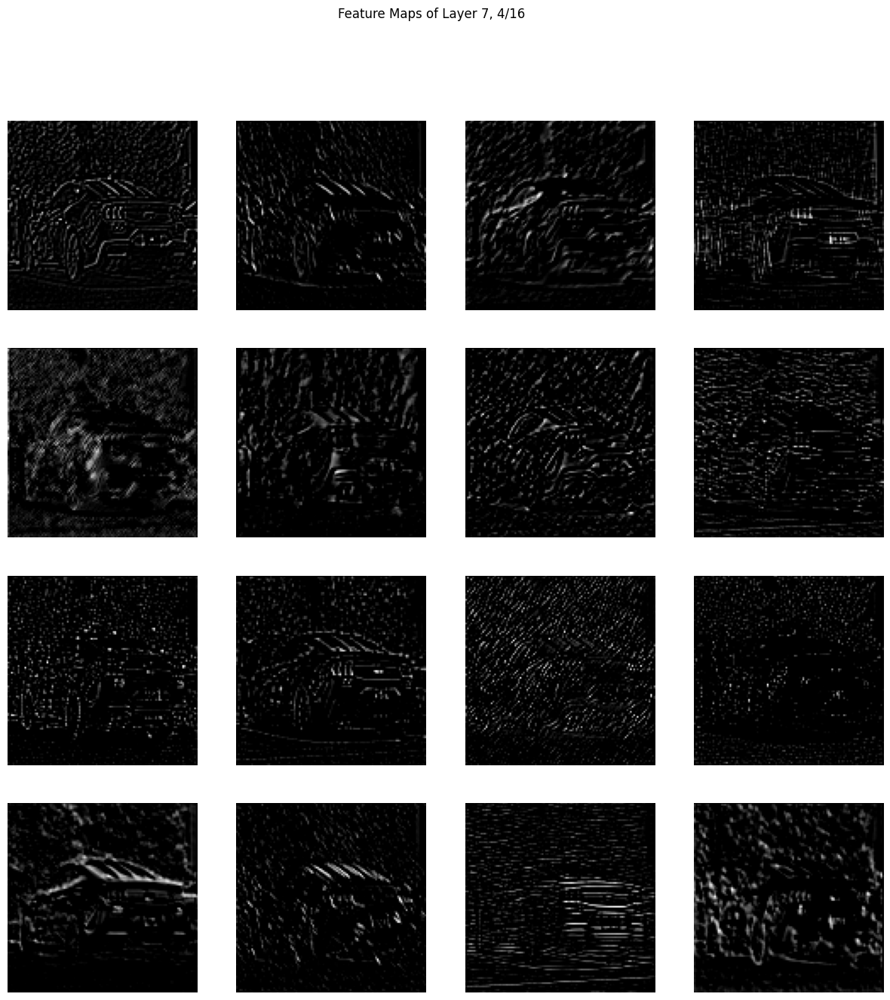

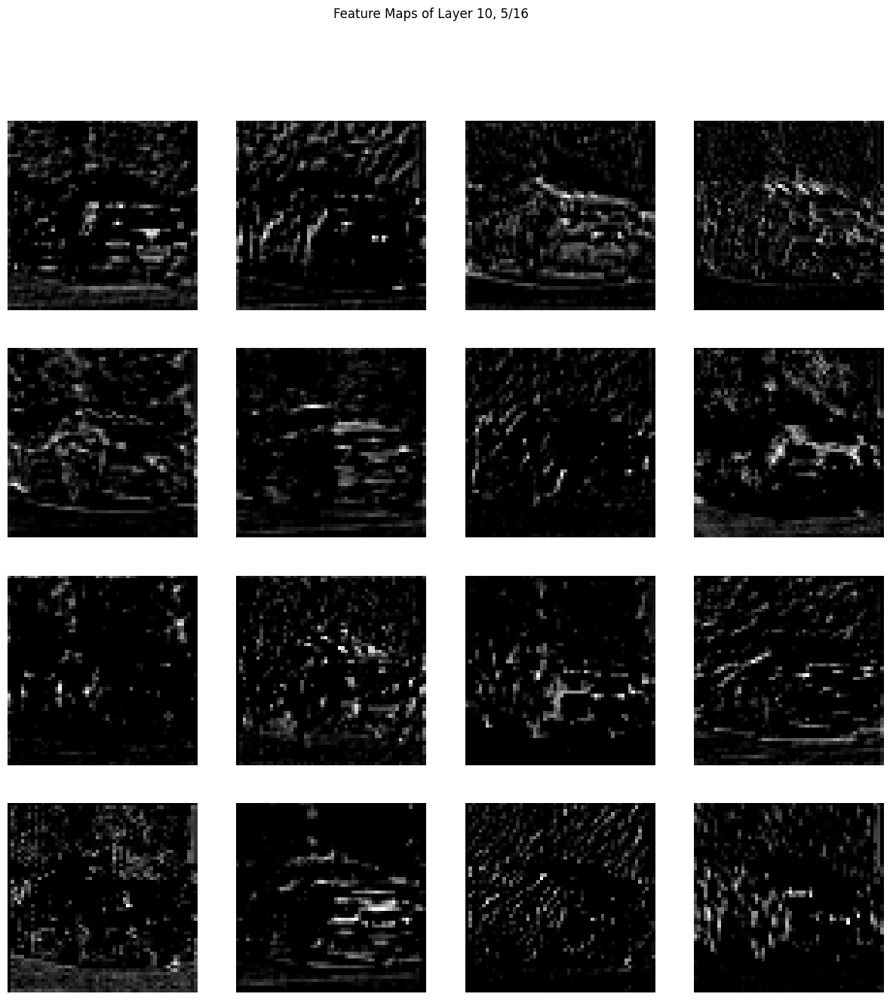

...

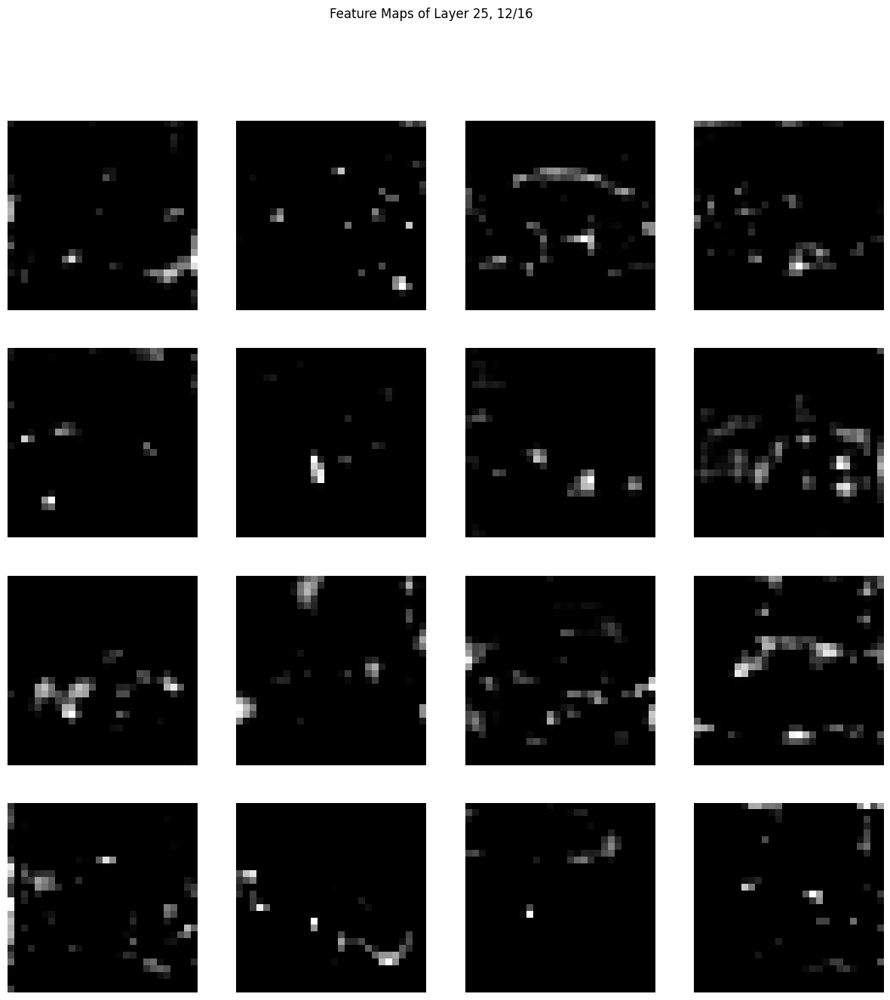

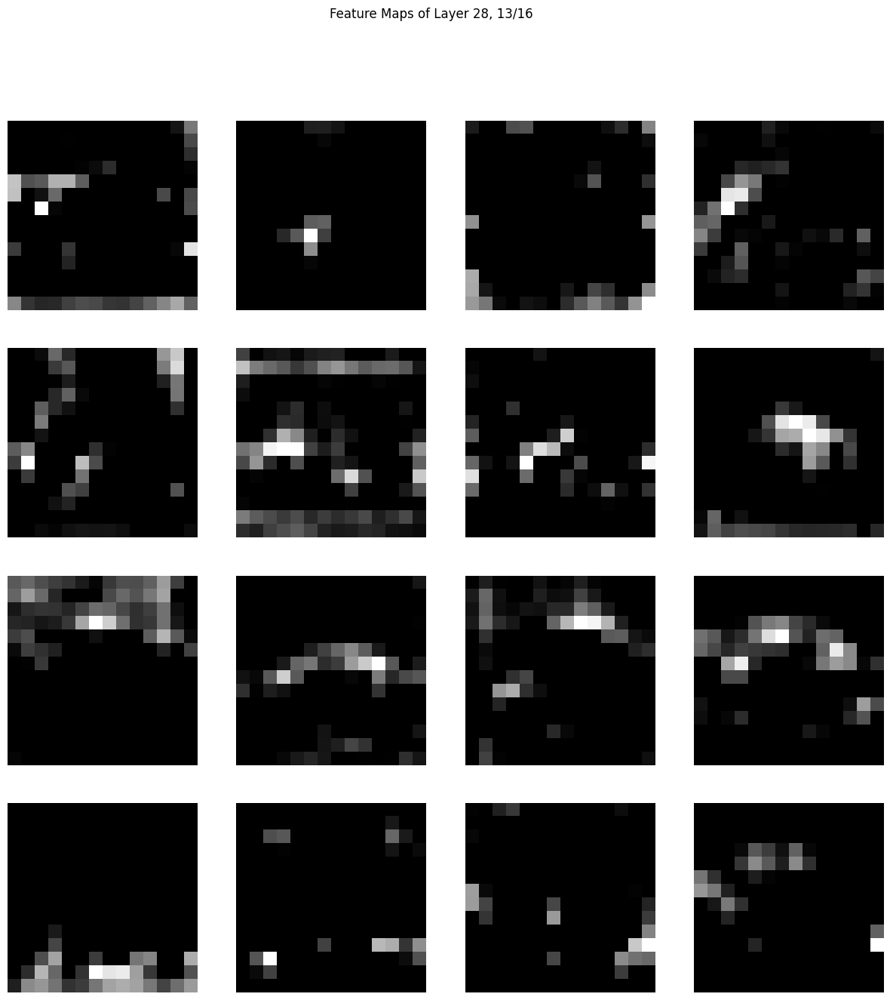

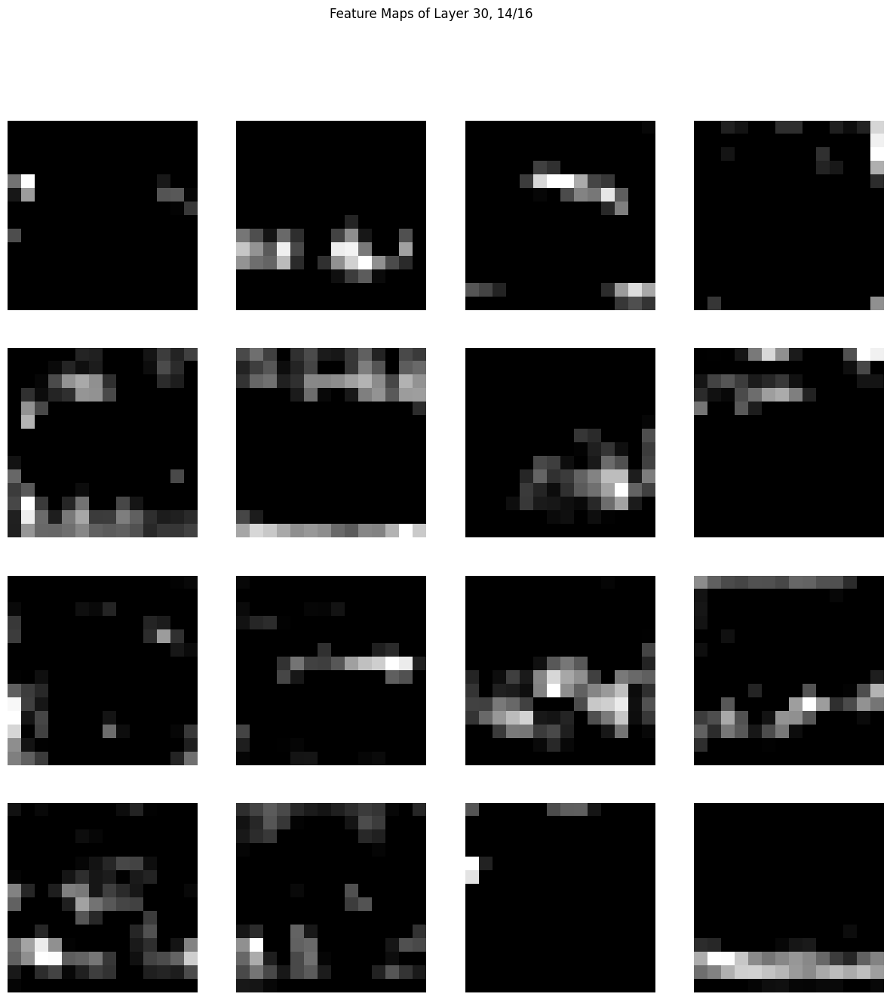

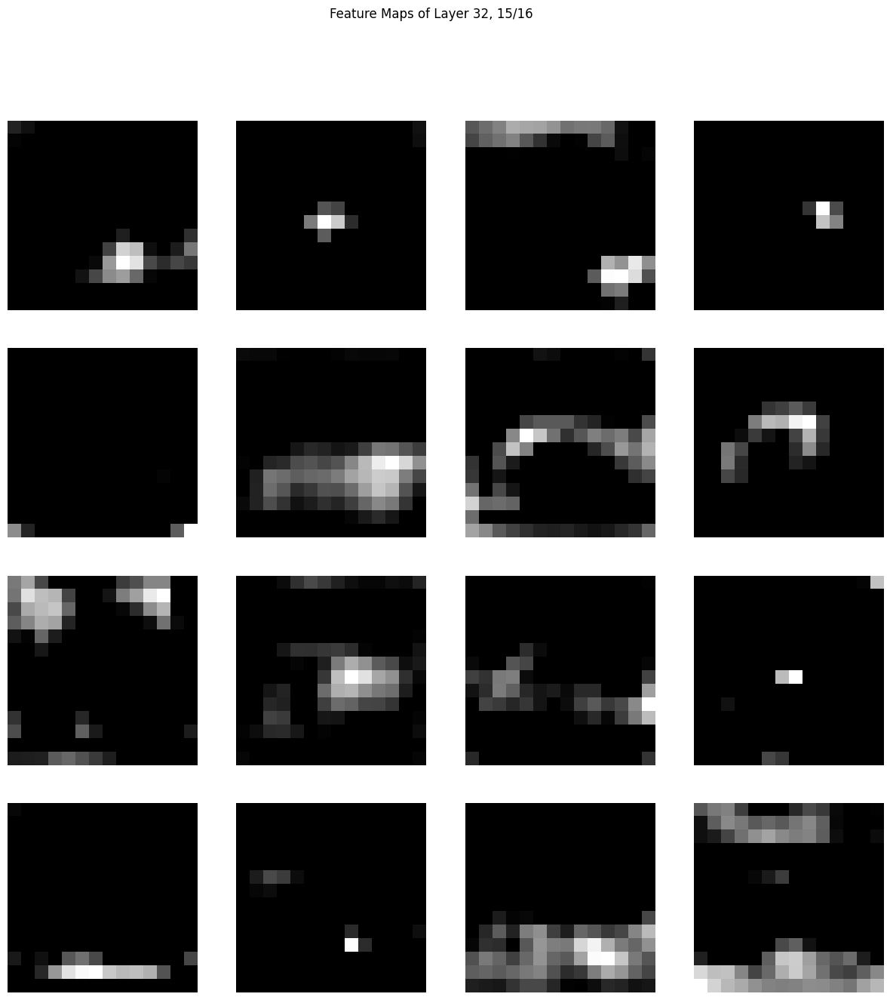

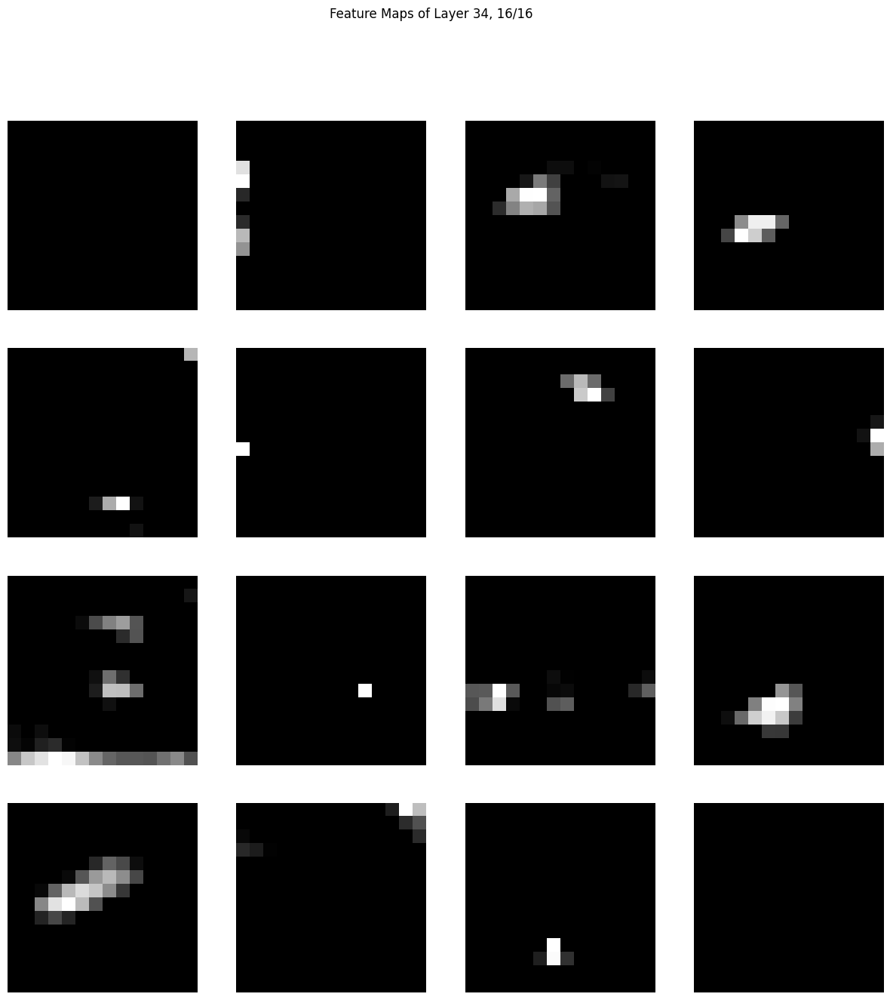

In [26]:
conv_counter = 0
for name, feature_maps in activation.items():
    plt.figure(figsize=(15, 15))
    n_rows = int(np.sqrt(min(16, feature_maps.size(1))))
    
    for fmap_idx in range(min(16, feature_maps.size(1))):
        plt.subplot(n_rows, n_rows, fmap_idx + 1)
        plt.imshow(feature_maps[0, fmap_idx].detach().cpu(), cmap="gray")
        plt.axis("off")
        
    conv_counter += 1
    plt.suptitle(f"Feature Maps of Layer {name}, {conv_counter}/16")
    plt.show()

It's fun too look under the hood, isn't it? As you can see, we can guess what are the learned features in each layer if the network (at least in the first layers). For example, in the first layer, the network learns to detect edges, and in the second layer, it learns to detect simple shapes. In the deeper layers, the network learns to detect more complex features.

### 2.3 - Content and Style Loss (15/90 pts)

In order to learn the correct image and keep the content of the original image while applying the style of the seconf image, we need 2 losses: 1. Content Loss and 2. Style Loss. Let's delve into each one!

**Content Loss** is responsible for keeping the content of the original image. It is calculated as the mean squared error between the feature maps of the original image and the generated image.

In [27]:
class ContentLoss(nn.Module):
    def __init__(self, target):
        super(ContentLoss, self).__init__()
        self.target = target.detach()
        self.loss = 0.0

    def forward(self, input):
        self.loss = nn.functional.mse_loss(input, self.target)
        return input

**Style Loss** is responsible for applying the style of the second image to the generated image. It is calculated as the mean squared error between the Gram matrices of the feature maps of the second image and the generated image.

In [28]:
def gram_calculator(input):
    S, C, H, W = input.size()
    features = input.view(S * C, H * W)
    gram_matrix = torch.mm(features, features.t()).div(S * C * H * W)
    return gram_matrix

In [29]:
class StyleLoss(nn.Module):
    def __init__(self, target_feature):
        super(StyleLoss, self).__init__()
        self.target_gram = gram_calculator(target_feature).detach()
        self.loss = 0.0

    def forward(self, input):
        input_gram = gram_calculator(input)
        self.loss = nn.functional.mse_loss(input_gram, self.target_gram)
        return input

Now, we use `features` part of the VGG model to extract features from the content and style images. Then, we calculate the content and style loss using the extracted features.

In [30]:
cnn = vgg19(weights=VGG19_Weights.DEFAULT).features.to(device)

In [31]:
cnn_normalization_mean = torch.tensor([0.485, 0.456, 0.406])
cnn_normalization_std = torch.tensor([0.229, 0.224, 0.225])

class Normalization(nn.Module):
    def __init__(self, mean, std):
        super(Normalization, self).__init__()
        self.mean = mean.clone().detach().view(-1, 1, 1).to(device)
        self.std = std.clone().detach().view(-1, 1, 1).to(device)

    def forward(self, img):
        return (img - self.mean) / self.std
    
normalizer = Normalization(cnn_normalization_mean, cnn_normalization_std)

content_image_normalized = normalizer(content_image).to(device)
style_image_normalized = normalizer(style_image).to(device)

Please note that after which layers you should calculate the content loss and after which ones, you should calculate the style loss. Use the layer names you saw earlier in the `torchsummary` output for VGG19 model.

In [32]:
content_layers_default = ["conv4_2"]
style_layers_default = ["conv1_1", "conv2_1", "conv3_1", "conv4_1", "conv5_1"]

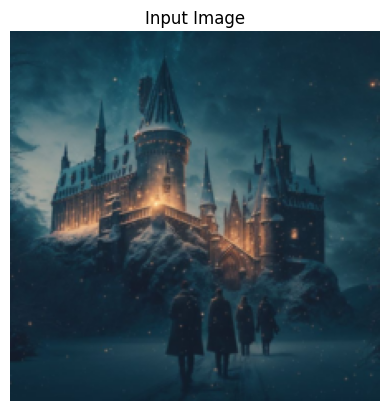

In [33]:
imshow(content_image, "Input Image")

(15/90 pts) Now, we need to define our optimizer. We use `LBFGS` optimizer. Let's get familiar with this optimizer a little bit:

Let's use this optimizer to optimize a simple function $f(x) = x^2$. We want to find the minimum of this function using `LBFGS` optimizer. First, you should initialize a tensor $x$ with a random value. Then, you should define a closure function that calculates the value of the function and its gradient. Finally, you should use the `step` method of the optimizer to update the value of $x$.

And lastly, you should generate an animation using `matplotlib.animation` to show how the value of $x$ changes during optimization.

In [34]:
import matplotlib.animation as animation
from torch.optim import LBFGS
import IPython.display as display

def quadratic(x):
    return x ** 2

x = torch.tensor([7.0], requires_grad=True)
x_values = []
y_values = []

optimizer = LBFGS([x], lr=0.1)

def closure():
    optimizer.zero_grad()
    y = quadratic(x)
    y.backward()
    x_values.append(x.item())
    y_values.append(y.item())
    return y

num_steps = 15
for step in range(num_steps):
    optimizer.step(closure)
        
fig, ax = plt.subplots()
line = ax.plot(x_values[0], y_values[0], "bo-", markersize=4)[0]
ax.set(xlim=(-1, 10), ylim=(0, 50))

def update(frame):
    line.set_data(x_values[:frame], y_values[:frame])
    return line

anim = animation.FuncAnimation(fig, func=update, frames=len(x_values), interval=30, blit=False)
plt.close()
display.HTML(anim.to_jshtml())

(35/90 pts) Now, let's use this optimizer to optimize our `input_image` to minimize the content and style loss. You should define a closure function that calculates the content and style loss and their gradients. Then, you should use the `step` method of the optimizer to update the value of the `input_image`. Please also **note** that you should use a weighted sum of the content and style loss to optimize the input image. (weight of each loss is a hyperparameter)

Optimizing:   0%|          | 0/300 [00:00<?, ?it/s]

Step 0:	Content Loss: 0.0000	Style Loss: 0.0248	Total Loss: 1239.9924


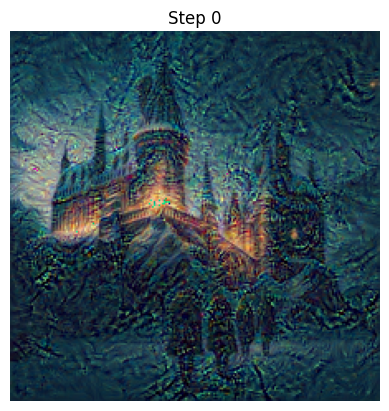

Optimizing:  17%|█▋        | 50/300 [02:30<13:05,  3.14s/it]

Step 50:	Content Loss: 18.8075	Style Loss: 0.0002	Total Loss: 29.2600


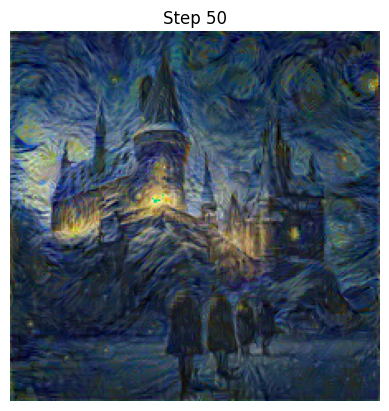

Optimizing:  33%|███▎      | 100/300 [05:01<09:57,  2.99s/it]

Step 100:	Content Loss: 18.1603	Style Loss: 0.0002	Total Loss: 28.0952


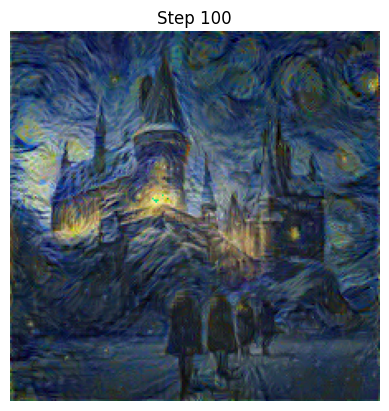

Optimizing:  50%|█████     | 150/300 [07:30<07:27,  2.98s/it]

Step 150:	Content Loss: 17.9099	Style Loss: 0.0002	Total Loss: 27.6540


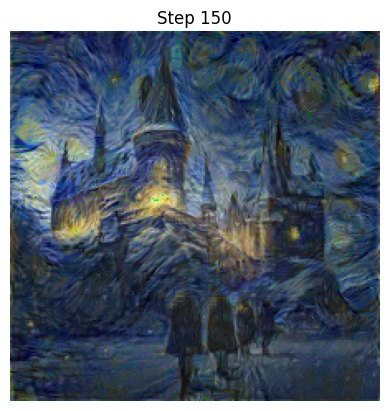

Optimizing:  67%|██████▋   | 200/300 [09:59<04:58,  2.99s/it]

Step 200:	Content Loss: 17.7760	Style Loss: 0.0002	Total Loss: 27.3994


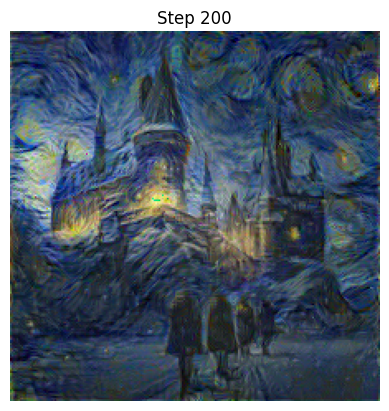

Optimizing:  83%|████████▎ | 250/300 [12:31<02:31,  3.02s/it]

Step 250:	Content Loss: 17.6690	Style Loss: 0.0002	Total Loss: 27.2024


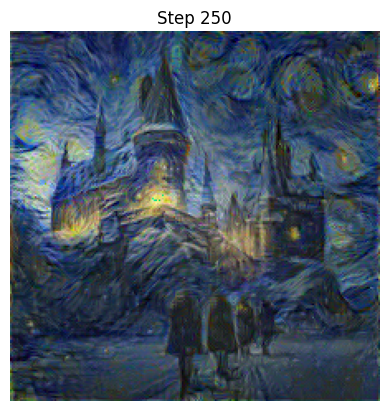

Optimizing: 100%|██████████| 300/300 [15:02<00:00,  3.01s/it]


In [35]:
class NSTModel(nn.Module):
    def __init__(self, cnn, normalizer, content_img, style_img, content_layers=content_layers_default, style_layers=style_layers_default):
        super(NSTModel, self).__init__()

        self.cl_models = []
        self.sl_models = []
        self.model = nn.Sequential(normalizer)
        
        layer_idx, conv_idx = 1, 0  
        for layer in cnn.children():
            if isinstance(layer, nn.Conv2d):
                conv_idx += 1
                name = f"conv{layer_idx}_{conv_idx}"
            elif isinstance(layer, nn.ReLU):
                name = f"relu{layer_idx}_{conv_idx}"
                layer = nn.ReLU(inplace=False)
            elif isinstance(layer, nn.MaxPool2d):
                name = f"pool{layer_idx}"
                layer_idx += 1
                conv_idx = 0
            elif isinstance(layer, nn.BatchNorm2d):
                name = f"bn{layer_idx}"

            self.model.add_module(name, layer.to(device))

            if name in content_layers:
                target_feature = self.model(content_img).detach()
                content_loss = ContentLoss(target_feature)
                self.model.add_module(f"content_loss_{layer_idx}", content_loss)
                self.cl_models.append(content_loss)

            if name in style_layers:
                target_feature = self.model(style_img).detach()
                style_loss = StyleLoss(target_feature)
                self.model.add_module(f"style_loss_{layer_idx}", style_loss)
                self.sl_models.append(style_loss)
        
        for i in range(len(self.model) - 1, -1, -1):
            if isinstance(self.model[i], ContentLoss) or isinstance(self.model[i], StyleLoss):
                break
        self.model = self.model[:i + 1]

    def forward(self, x):
        self.model(x)
        content_loss = sum([loss.loss for loss in self.cl_models])
        style_loss = sum([loss.loss for loss in self.sl_models])
        return content_loss, style_loss


content_weight = 1
style_weight = 5e4
num_iters = 300
plot_interval = 50

nst = NSTModel(cnn, normalizer, content_image, style_image).to(device)

input_image = content_image.clone().requires_grad_(True).to(device)
optimizer = optim.LBFGS([input_image], lr=0.1)

content_losses, style_losses, total_losses = [], [], []

def closure():
    optimizer.zero_grad()
    
    cl, sl = nst(input_image)
    tl = content_weight * cl + style_weight * sl
    tl.backward(retain_graph=True)
    
    if log_loss[0]:
        content_losses.append(cl.item())
        style_losses.append(sl.item())
        total_losses.append(tl.item())
        
    log_loss[0] = False
    
    return tl

for step in tqdm(range(num_iters), desc="Optimizing"):
    log_loss = [True]
    optimizer.step(closure)
    
    with torch.no_grad():
        input_image.clamp_(0, 255)
        
    if step % plot_interval == 0:
        print(f"Step {step}:\tContent Loss: {content_losses[-1]:.4f}\tStyle Loss: {style_losses[-1]:.4f}\tTotal Loss: {total_losses[-1]:.4f}")
        imshow(input_image, f"Step {step}")
        plt.show()
    

Now, let's see the result of optimization process on our `input_image`.

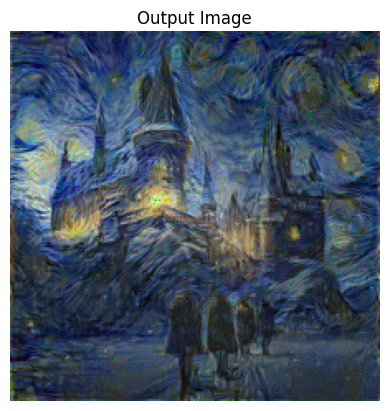

In [36]:
imshow(input_image, "Output Image")
plt.show()

(5/90 pts) Also, let's plot our `style_losses`, `content_losses` and `total_losses` to see how they change during the optimization process.

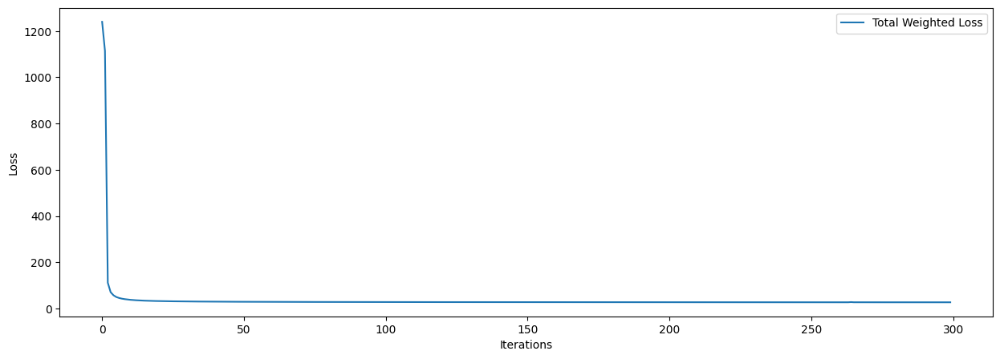

In [37]:
plt.figure(figsize=(15, 5))
plt.plot(total_losses, label="Total Weighted Loss")
plt.xlabel("Iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()

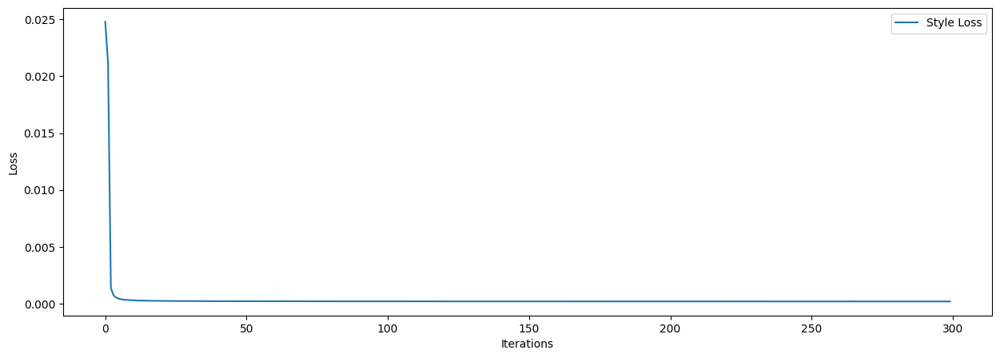

In [38]:
plt.figure(figsize=(15, 5))
plt.plot(style_losses, label="Style Loss")
plt.xlabel("Iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()

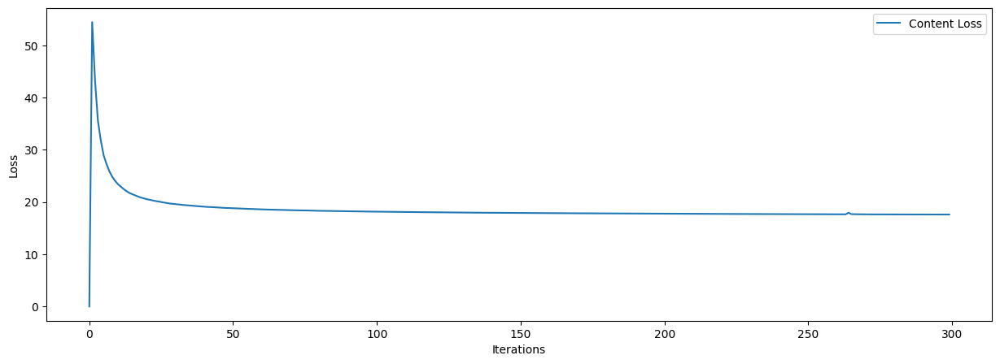

In [39]:
plt.figure(figsize=(15, 5))
plt.plot(content_losses, label="Content Loss")
plt.xlabel("Iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()